# Plot up maps of Uncertainty in CO2 Flux for pCO2-Residual technique 

In [1]:
# Modules

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import cmocean as cm            # really nice colorbars
import matplotlib.pyplot as plt # for making plots
%matplotlib inline
%config InlineBackend.figure_format = 'jpeg'
%config InlineBackend.print_figure_kwargs = {'dpi':1200}

# We need STD and Mean of pCO2 Prediction

In [2]:
# Open file with pCO2_DIC, pCO2_T, and SOCAT pCO2
#run_dir = "/data/artemis/workspace/vbennington/SOCAT_ML/pCO2_DIC_Taka/models/reconstructions/xg"
xgr_dir = "/data/artemis/workspace/vbennington/SOCAT_ML/pCO2_DIC/models/reconstructions/xgr"
run_name = 'our_pco2'
alpha1 = 90
alpha2 = 67

run_dir = '/data/artemis/workspace/vbennington/SOCAT_ML/pCO2_DIC/models/reconstructions/xg'

In [3]:
fi = xr.Dataset({})
# Get 1 std (alpha = 67)
# Assume normally distributed about the predicted pCO2

/home/vbennington/.conda/envs/dev2/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]


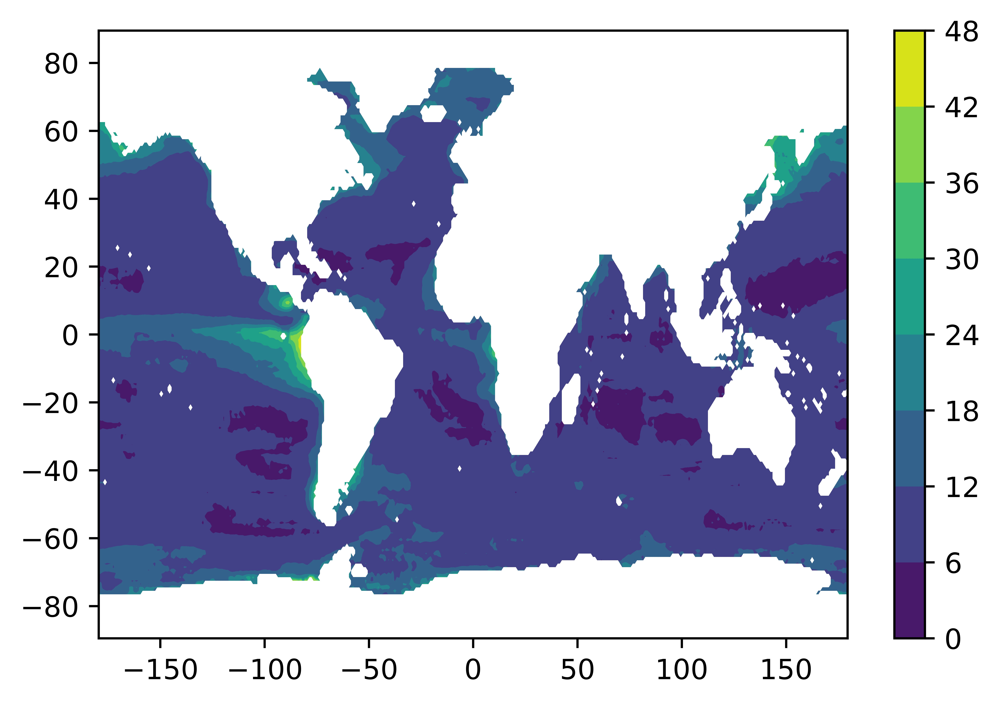

In [4]:
fir = xr.open_dataset(f"{run_dir}/xg_recon_pCO2_2D_mon_mean_1x1_198201-201912.nc")
fir = fir.transpose('time','ylat','xlon')
fir = fir.rename({'ylat':'lat','xlon':'lon'})
fi['mean'] = fir.pCO2_recon


alph = alpha2
fim = xr.open_dataset(f"{xgr_dir}/xgr_recon_alpha{alph}_pCO2_2D_mon_1x1_198201-201912.nc")
fim = fim.transpose('time','ylat','xlon')
fim = fim.rename({'ylat':'lat','xlon':'lon'})
fi["std"] = (fim.pCO2_DIC_upper_recon - fim.pCO2_DIC_lower_recon)/2
fig = plt.figure()
plt.contourf(fim.lon,fim.lat,np.nanmean(fi['std'],axis=0))
plt.colorbar()



In [5]:
# Make room in memory:
del fim, fir

In [16]:
# Now Sample from distribution 500 times and calculate flux

for year in range(1982,1991):
    print(year)
    
    test_pco2 = fi['mean'].sel(time=slice(f'{year}-01-01',f'{year}-12-31'))
    test_std = fi['std'].sel(time=slice(f'{year}-01-01',f'{year}-12-31'))
    test_time = fi.time.sel(time=slice(f'{year}-01-01',f'{year}-12-31'))
    
    # Get sample pCO2:
    pco2_map = sample_pco2(test_pco2,test_std) # predicted pCO2 and 1 STD from quantile regression
    
    # Get rid of zeros where NaNs were:
    pco2_map = np.where(pco2_map>0,pco2_map,np.nan)
    
    # Go from numpy array to DataFrame:
    DS = xr.Dataset({
                    'sampled_pco2':(["trial","time","lat","lon"],pco2_map),
                    'pco2_std':(["time","lat","lon"],test_std),
                    'pco2_mean':(["time","lat","lon"],test_pco2)},
                    coords={'trial':(['trial'],range(500)),
                            'time': (['time'],test_pco2.time.values),
                            'lat':(['lat'],test_pco2.lat.values),
                            'lon':(['lon'],test_pco2.lon.values)})
    DS['sampled_pco2'].attrs['description'] = 'pCO2 Sampled from normal distribution'
    DS['sampled_pco2'].attrs['fill_value'] = 'NaN'
    DS['sampled_pco2'].attrs['units'] = 'uatm'
    DS['pco2_std'].attrs['description'] = 'STD as 1/2 * (upper 67% - lower 67% quantile)'
    DS['pco2_std'].attrs['units'] = 'uatm'
    DS['pco2_mean'].attrs['units'] = 'uatm'
    DS['pco2_mean'].attrs['description'] = 'pCO2 reconstructed by our XGBoost Run'
    
    # Write to File so we don't have to do this again:
    DS.to_netcdf(f"{run_dir}/MonteCarlo_pCO2_Residual_{year}.nc")
    
    # Delete vars
    del test_std, pco2_map
    
    for windp in ['CCMP2', 'ERA5', 'JRA55']:
        print(windp)
    
        # CO2 Flux from sampled pCO2:
        flux_map, flux_pg = flux_from_pco2(DS.sampled_pco2,DS.time,windp) # Annual Flux for each trial at every grid cell
    
        # Go from numpy array to DataFrame:
        DF = xr.Dataset({
                    'sampled_flux':(["trial","lat","lon"],flux_map),
                    'flux_PgC':(["trial"],flux_pg)},
                      coords={'trial':(['trial'],range(500)),
                            'lat':(['lat'],test_pco2.lat.values),
                            'lon':(['lon'],test_pco2.lon.values)})
        DF['sampled_flux'].attrs['description'] = 'pCO2 Sampled from normal distribution'
        DF['sampled_flux'].attrs['fill_value'] = 'NaN'
        DF['sampled_flux'].attrs['units'] = 'mol/m2/year'
   
         # Write to File so we don't have to do this again:
        DF.to_netcdf(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_{windp}_{year}.nc")
    
        del DF, flux_map, flux_pg
    del DS, test_pco2

1982
2021-12-04 20:55:43.868953
time step = 0
time step = 1
time step = 2
time step = 3
time step = 4
time step = 5
time step = 6
time step = 7
time step = 8
time step = 9
time step = 10
time step = 11
2021-12-04 21:12:00.958953
CCMP2
ERA5
JRA55
1983
2021-12-04 21:12:56.181734
time step = 0
time step = 1
time step = 2
time step = 3
time step = 4
time step = 5
time step = 6
time step = 7
time step = 8
time step = 9
time step = 10
time step = 11
2021-12-04 21:29:00.576474
CCMP2
ERA5
JRA55
1984
2021-12-04 21:29:56.777288
time step = 0
time step = 1
time step = 2
time step = 3
time step = 4
time step = 5
time step = 6
time step = 7
time step = 8
time step = 9
time step = 10
time step = 11
2021-12-04 21:46:03.128186
CCMP2
ERA5
JRA55
1985
2021-12-04 21:46:57.438936
time step = 0
time step = 1
time step = 2
time step = 3
time step = 4
time step = 5
time step = 6
time step = 7
time step = 8
time step = 9
time step = 10
time step = 11
2021-12-04 22:03:08.984867
CCMP2
ERA5
JRA55
1986
2021-12-04 

In [12]:
ds = xr.open_dataset(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_JRA55_2015.nc")

In [13]:
dx = xr.open_dataset(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_ERA5_2015.nc")

In [14]:
dc = xr.open_dataset(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_CCMP2_2015.nc")

In [54]:
ds.flux_PgC.mean()

<xarray.DataArray 'flux_PgC' ()>
array(-2.1371005)

In [55]:
dc.flux_PgC.mean()

<xarray.DataArray 'flux_PgC' ()>
array(-1.97743049)

In [56]:
dx.flux_PgC.mean()

<xarray.DataArray 'flux_PgC' ()>
array(-2.00273247)

In [59]:
np.std([-2.00273247,-2.137,-1.977431])

0.07002396395953935

(array([ 10.,  26.,  49.,  76., 103.,  97.,  77.,  41.,  18.,   3.]),
 array([-1.98675743, -1.98483404, -1.98291065, -1.98098725, -1.97906386,
        -1.97714047, -1.97521708, -1.97329368, -1.97137029, -1.9694469 ,
        -1.9675235 ]),
 <a list of 10 Patch objects>)

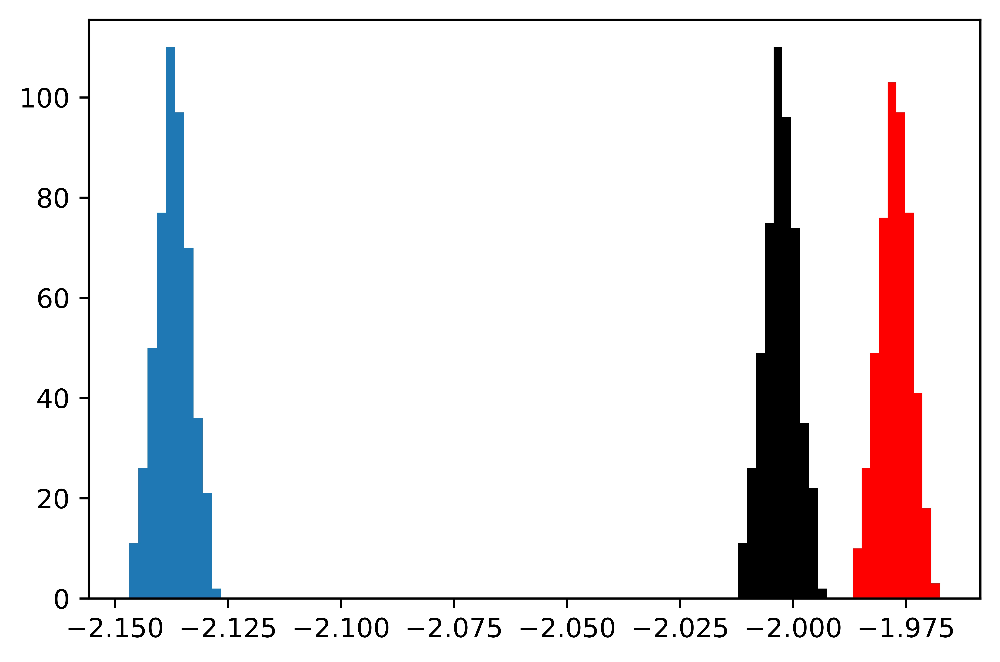

In [15]:
fig = plt.figure()
plt.hist(ds.flux_PgC)
plt.hist(dx.flux_PgC,color='black')
plt.hist(dc.flux_PgC,color='red')

/home/vbennington/.conda/envs/dev2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


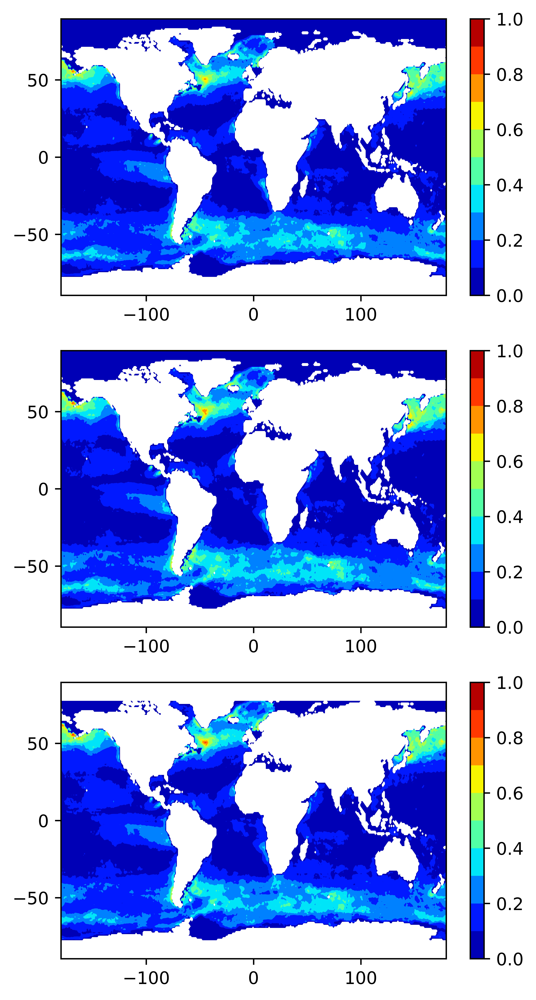

In [40]:
fig,axs = plt.subplots(3,1,figsize=(5,10))
x0=axs[0].contourf(dx.lon,dx.lat,np.nanstd(dx.sampled_flux,axis=0),levels=np.linspace(0,1,11),cmap='jet')
plt.colorbar(x0,ax=axs[0])
x1=axs[1].contourf(dx.lon,dx.lat,np.nanstd(ds.sampled_flux,axis=0),levels=np.linspace(0,1,11),cmap='jet')
plt.colorbar(x1,ax=axs[1])
x2=axs[2].contourf(dx.lon,dx.lat,np.nanstd(dc.sampled_flux,axis=0),levels=np.linspace(0,1,11),cmap='jet')
plt.colorbar(x0,ax=axs[2])

In [41]:
# Let's create single file that sums up the major properties of all these files we've created:

flux_ts_mean = np.empty(shape=(3,2019-1982+1))
flux_ts_std = np.empty(shape=(3,2019-1982+1))
flux_space_mean = np.empty(shape=(3,2019-1982+1,180,360))
flux_space_std = np.empty(shape=(3,2019-1982+1,180,360))

for year in range(1982,2020):
    w = 0
    for windp in ['CCMP2', 'ERA5', 'JRA55']:
        
        ds = xr.open_dataset(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_{windp}_{year}.nc")
        
        flux_ts_mean[w,year-1982] = np.nanmean(ds.flux_PgC,axis=0)
        flux_ts_std[w,year-1982] = np.nanstd(ds.flux_PgC,axis=0)
        
        flux_space_mean[w,year-1982,:,:] = np.nanmean(ds.sampled_flux,axis=0)
        flux_space_std[w,year-1982,:,:] = np.nanstd(ds.sampled_flux,axis=0)

        w += 1
        
        
# Go from numpy array to DataFrame:
DV = xr.Dataset({
                    'flux_mean':(["wind","year","lat","lon"],flux_space_mean),
                    'flux_std':(["wind","year","lat","lon"],flux_space_std),
                    'flux_PgC_mean':(["wind","year"],flux_ts_mean),
                    'flux_PgC_std':(["wind","year"],flux_ts_std)},
                    coords={'year':(['year'],range(1982,2020)),
                            'wind':(['wind'],['CCMP2', 'ERA5', 'JRA55']),
                            'lat':(['lat'],ds.lat.values),
                            'lon':(['lon'],ds.lon.values)})
DV['flux_mean'].attrs['description'] = 'CO2 Flux Mean over 500 trials'
DV['flux_mean'].attrs['fill_value'] = 'NaN'
DV['flux_mean'].attrs['units'] = 'mol/m2/year'
DV['flux_std'].attrs['description'] = 'CO2 Flux STD over 500 trials'
DV['flux_std'].attrs['fill_value'] = 'NaN'
DV['flux_std'].attrs['units'] = 'mol/m2/year'
DV['flux_PgC_mean'].attrs['description'] = 'CO2 Flux Mean Time Series over 500 trials - no river flux adjustment'
DV['flux_PgC_mean'].attrs['fill_value'] = 'NaN'
DV['flux_PgC_mean'].attrs['units'] = 'PgC/year'
DV['flux_PgC_std'].attrs['description'] = 'CO2 Flux STD Time Series over 500 trials - no river flux adjustment'
DV['flux_PgC_std'].attrs['fill_value'] = 'NaN'
DV['flux_PgC_std'].attrs['units'] = 'PgC/year'

   
# Write to File so we don't have to do this again:
DV.to_netcdf(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_allyears_allwinds.nc")

/home/vbennington/.conda/envs/dev2/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: Mean of empty slice
/home/vbennington/.conda/envs/dev2/lib/python3.6/site-packages/numpy/lib/nanfunctions.py:1667: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)


In [16]:
dv = xr.open_dataset(f"{run_dir}/MonteCarlo_CO2Flux_pCO2_Residual_allyears_allwinds.nc")
print(dv)

<xarray.Dataset>
Dimensions:        (lat: 180, lon: 360, wind: 3, year: 38)
Coordinates:
  * year           (year) int64 1982 1983 1984 1985 1986 ... 2016 2017 2018 2019
  * wind           (wind) object 'CCMP2' 'ERA5' 'JRA55'
  * lat            (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
  * lon            (lon) float64 -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
Data variables:
    flux_mean      (wind, year, lat, lon) float64 ...
    flux_std       (wind, year, lat, lon) float64 ...
    flux_PgC_mean  (wind, year) float64 ...
    flux_PgC_std   (wind, year) float64 ...


In [64]:
print(dv.flux_PgC_mean.sel(year=slice('1988','2019')).std("wind"))

<xarray.DataArray 'flux_PgC_mean' (year: 32)>
array([0.06731895, 0.06064843, 0.07316126, 0.07160286, 0.08596555,
       0.09971412, 0.08999917, 0.08945465, 0.10109523, 0.07983802,
       0.05233263, 0.05538246, 0.04707396, 0.0448531 , 0.05361497,
       0.05802342, 0.05636196, 0.06959288, 0.06683023, 0.05687131,
       0.0445273 , 0.05573344, 0.07069575, 0.07777406, 0.07183749,
       0.06556313, 0.07130221, 0.07007098, 0.05851146, 0.06951033,
       0.07399413, 0.07674778])
Coordinates:
  * year     (year) int64 1988 1989 1990 1991 1992 ... 2015 2016 2017 2018 2019


In [65]:
print(dv.flux_PgC_std.sel(year=slice('1988','2019')).sel(wind='JRA55'))

<xarray.DataArray 'flux_PgC_std' (year: 32)>
array([0.004015, 0.003793, 0.003492, 0.003436, 0.003775, 0.004096, 0.004095,
       0.003722, 0.003742, 0.003674, 0.003856, 0.003813, 0.003612, 0.003826,
       0.00441 , 0.0041  , 0.00423 , 0.004126, 0.003894, 0.004042, 0.003988,
       0.00389 , 0.003985, 0.004056, 0.003616, 0.003991, 0.003971, 0.003712,
       0.003785, 0.003835, 0.003752, 0.004034])
Coordinates:
  * year     (year) int64 1988 1989 1990 1991 1992 ... 2015 2016 2017 2018 2019
    wind     <U5 'JRA55'
Attributes:
    description:  CO2 Flux STD Time Series over 500 trials - no river flux ad...
    fill_value:   NaN
    units:        PgC/year


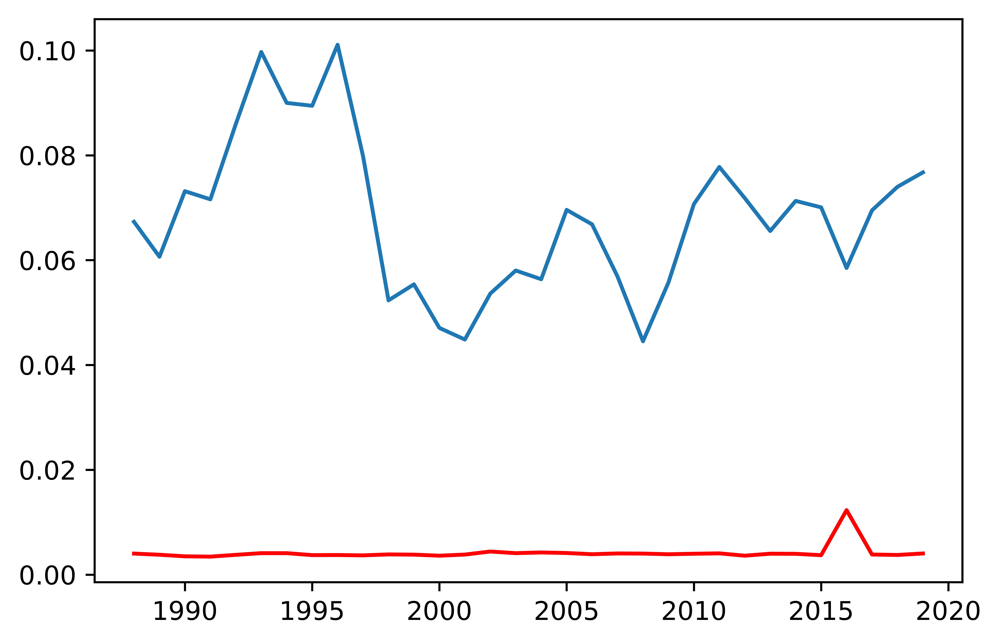

In [67]:
fig = plt.figure()
plt.plot(dv.year.sel(year=slice('1988','2019')),dv.flux_PgC_mean.sel(year=slice('1988','2019')).std("wind"))
plt.plot(dv.year.sel(year=slice('1988','2019')),dv.flux_PgC_std.sel(year=slice('1988','2019')).max("wind"),color='red')

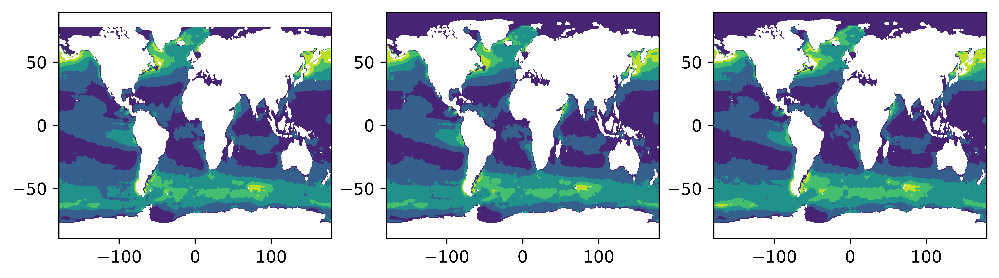

In [24]:
fig,axs = plt.subplots(1,3,figsize=(10,2.5))
axs[0].contourf(dv.lon,dv.lat,flux_std[0,:,:,:].mean("year"),levels=np.linspace(0,0.5,6))
axs[1].contourf(dv.lon,dv.lat,flux_std[1,:,:,:].mean("year"),levels=np.linspace(0,0.5,6))
axs[2].contourf(dv.lon,dv.lat,flux_std[2,:,:,:].mean("year"),levels=np.linspace(0,0.5,6))

In [25]:
sk = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/SeaFlux_v2021.04_kw_quadratic_scaled_1982-2020.nc')
kw = sk.kw.sel(wind=[f"CCMP2","ERA5","JRA55"]).squeeze() 

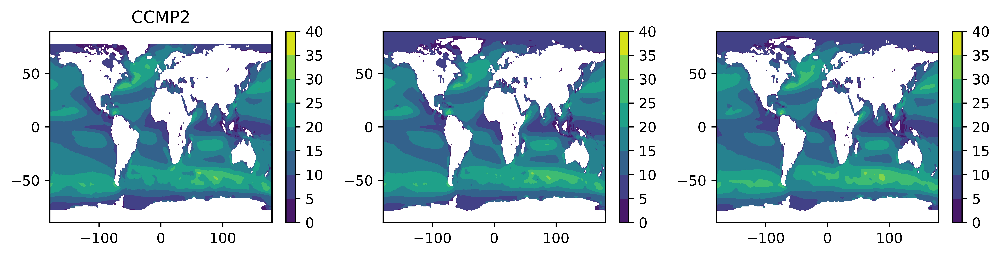

In [33]:
fig,axs = plt.subplots(1,3,figsize=(12,2.5))
x0=axs[0].contourf(kw.lon,kw.lat,kw[0,:,:,:].mean("time"),levels=np.linspace(0,40,9))
x1=axs[1].contourf(kw.lon,kw.lat,kw[1,:,:,:].mean("time"),levels=np.linspace(0,40,9))
x2=axs[2].contourf(kw.lon,kw.lat,kw[2,:,:,:].mean("time"),levels=np.linspace(0,40,9))
axs[0].set_title("CCMP2")
plt.colorbar(x0,ax=axs[0])
plt.colorbar(x1,ax=axs[1])
plt.colorbar(x2,ax=axs[2])

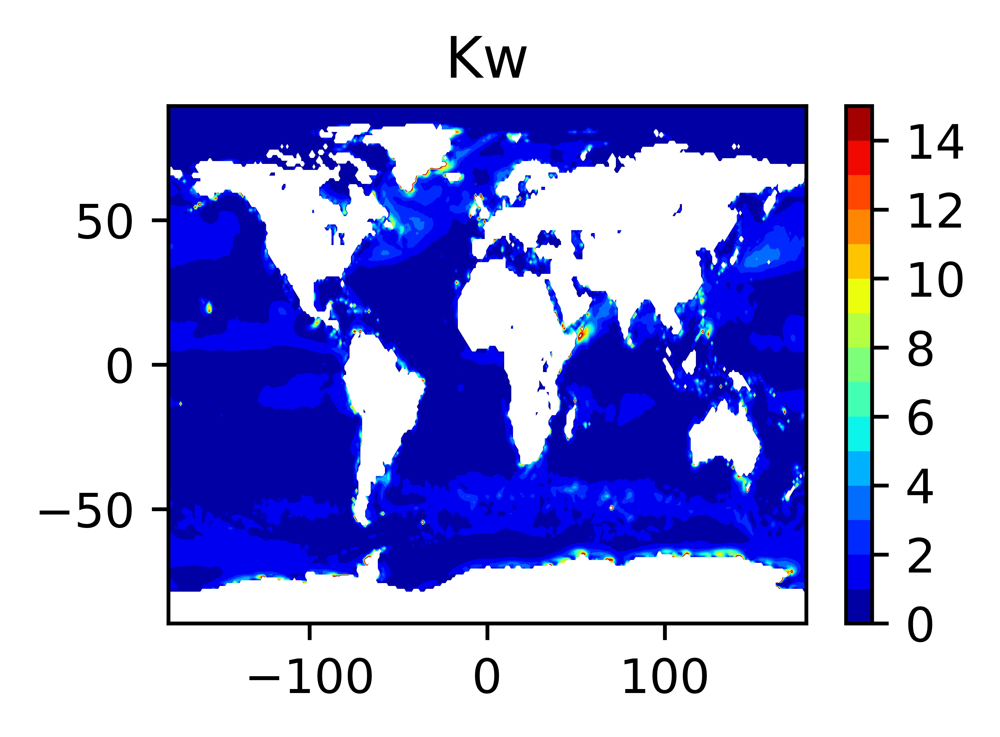

In [45]:
fig,axs = plt.subplots(1,1,figsize=(3,2))
x0=plt.contourf(kw.lon,kw.lat,kw.var("wind").mean("time"),levels=np.linspace(0,15,16),cmap='jet')
plt.title("Kw")
plt.colorbar()


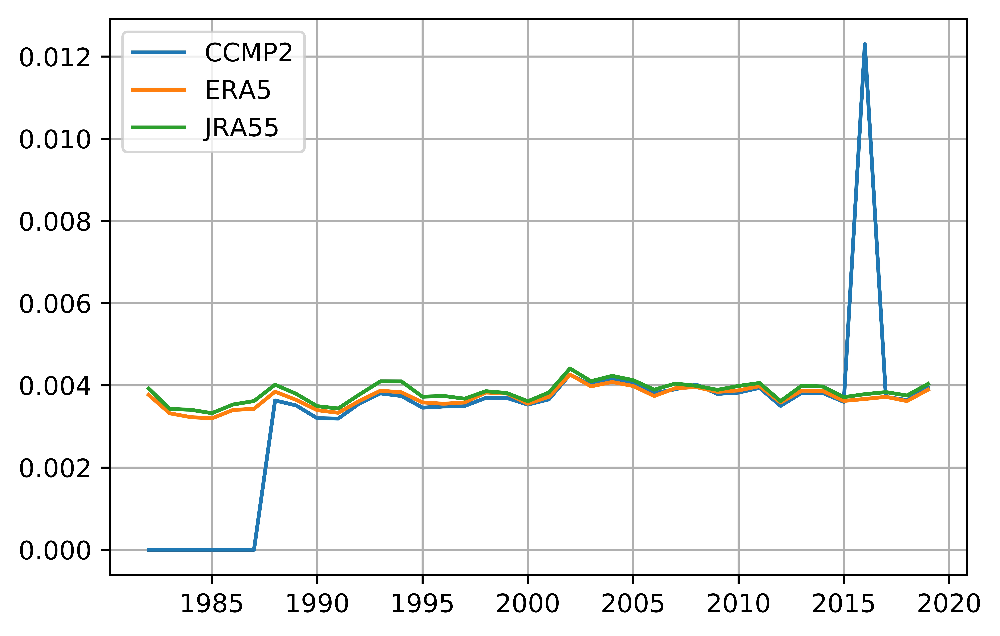

In [63]:
fig = plt.figure()
for w in range(0,3):
    plt.plot(dv.year,dv.flux_PgC_std[w,:],label=dv.wind[w].values)
plt.legend()
plt.grid(True)

In [9]:
def sample_pco2(pco2_mean,pco2_std):
    #pco2_mean(time,lat,lon)
    #pco2_std(time,lat,lon)
    
    samples = 500
    
    import datetime
    # Initialize Output:
    pco2_map = np.empty(shape=(samples,len(pco2_mean),180,360)) # 500 samples for each time step at each point!
    
    print(datetime.datetime.now())
    # Must loop (Agh!)
    for t in range(12):
        print("time step =",t)
        for y in range(0,180):
            for x in range(0,360):
                mu = pco2_mean[t,y,x]
                if ~np.isnan(mu):
                    sigma = abs(pco2_std[t,y,x])
                    pco2_map[:,t,y,x] = np.random.normal(mu, sigma, samples)
    
    print(datetime.datetime.now())
    return pco2_map   

In [10]:
def flux_from_pco2(pco2_map,pco2_time,windp):
    
    # pco2_map (trial,month,lat,lon)
    # pco2_time is time for the selected year
    # windp is wind product
    
    # Open what we need:
    
    # Piston Velocity : 
    sk = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/SeaFlux_v2021.04_kw_quadratic_scaled_1982-2020.nc')
    kw = sk.kw.sel(time=pco2_time).sel(wind=[f"{windp}"]).squeeze() * 87.6  # --> cm/hr now m/yr (no NCEP Winds)
    # solubility (mol/m3/uatm) and kw converted from (cm/hr) to (m/s)
    kw = kw.where(kw > 0)
    del sk
    
    # K0 : 
    sk0 = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/SeaFlux_v2021.04_solWeis74_1982-2020.nc')
    k0 = sk0.sol.sel(time=pco2_time)  # mol / m3 / uatm
    del sk0
    
    # ice fraction : 
    sice = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/SeaFlux_v2021.04_ice_1982-2020.nc')
    icef = sice.ice.sel(time=pco2_time)  # ice fraction 
    ice_weighting = 1 - icef.fillna(0)
    del sice, icef
    
    # Atmospheric CO2:
    satmos = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/SeaFlux_v2021.04_pco2atm_1982-2020.nc')
    atmos = satmos.pco2atm.sel(time=pco2_time)  # uatm
    del satmos
    
    # My Coastal Filling (1959-2019)
    coast = xr.open_dataset('/data/artemis/workspace/vbennington/LDEO_HPD/data_for_flux/coastal_scaling_map_centered_2006.nc')
    coast_fill = coast.sel(time=pco2_time).spco2_scale_clim    
    del coast
    
    # Fill coasts:
    pco2_filled = pco2_map.fillna(coast_fill)
    
    # Calc air-sea difference:
    delta_pco2 = pco2_filled - atmos
    
    del pco2_filled, atmos
        
    flux = k0 * kw * delta_pco2 * ice_weighting  # mol/m2/yr
    
    # Flux is (trial, wind, month, lat, lon)
    flux = flux.transpose('trial','time','lat','lon')
    
    # Only look at open ocean:
    mask = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/RECCAP2_region_masks_all.nc') 
    #replace longitude from 0-360 to -180 to 180
    mask['lon'] = list(map(lambda x: x-360 if x>180 else x, mask['lon'].values))
    # Sort by longitude
    mask = mask.sortby('lon')
    
    flux_masked = flux.where(mask['open_ocean']>0)
    flux_masked = flux_masked.mean("time")
    
    # Ocean Area:
    sarea = xr.open_dataset('/data/artemis/observations/SOCOM/extra_files/SeaFlux_v2021.04_area_ocean.nc')
    area = sarea.area_ocean
    del sarea
    
    flux_tmp = flux * area * 12 # g/yr   (mol / m2 / year * m2 * 12 g/mol)
    flux_ts = flux_tmp.where(mask['open_ocean']>0).sum(['lat','lon'])/(10**15) #% Pg/yr
    flux_ts = flux_ts.mean("time")
        
    del flux_tmp, area, mask
    
    return flux_masked, flux_ts

In [74]:
del fi, flux_space_mean, flux_space_std, sample_pco2